## DATA CLEANING AND PREPARATION 

In [0]:
## Uploading my dataset to pyspark

raw_df =spark.read.options(mode='FAILFAST', 
                              header = True, 
                              multiLine=True, 
                              inferSchema=True, 
                              escape='"').csv("/FileStore/tables/Modified_Employee_Attrition_Data.csv")

 

display(raw_df)

Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3.0,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2.0,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2.0,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3.0,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3.0,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3.0,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4.0,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3.0,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2.0,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3.0,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [0]:
raw_df.printSchema()

root
 |-- Age: integer (nullable = true)
 |-- Attrition: string (nullable = true)
 |-- BusinessTravel: string (nullable = true)
 |-- DailyRate: integer (nullable = true)
 |-- Department: string (nullable = true)
 |-- DistanceFromHome: integer (nullable = true)
 |-- Education: integer (nullable = true)
 |-- EducationField: string (nullable = true)
 |-- EmployeeCount: integer (nullable = true)
 |-- EmployeeNumber: integer (nullable = true)
 |-- EnvironmentSatisfaction: integer (nullable = true)
 |-- Gender: string (nullable = true)
 |-- HourlyRate: integer (nullable = true)
 |-- JobInvolvement: double (nullable = true)
 |-- JobLevel: integer (nullable = true)
 |-- JobRole: string (nullable = true)
 |-- JobSatisfaction: integer (nullable = true)
 |-- MaritalStatus: string (nullable = true)
 |-- MonthlyIncome: integer (nullable = true)
 |-- MonthlyRate: integer (nullable = true)
 |-- NumCompaniesWorked: integer (nullable = true)
 |-- Over18: string (nullable = true)
 |-- OverTime: string (

In [0]:
## Filtering the dataset to the columns we want to make sense of for analysis

columnsToKeep = [ 
 "Age",
 "Department", 
 "DistanceFromHome",  
 "EnvironmentSatisfaction", 
 "Gender", 
 "JobInvolvement", 
 "JobSatisfaction", 
 "MaritalStatus", 
 "MonthlyIncome", 
 "OverTime",
 "PercentSalaryHike",
 "WorkLifeBalance", 
 "YearsAtCompany", 
 "YearsInCurrentRole", 
 "YearsSinceLastPromotion", 
 "YearsWithCurrManager",
 "Attrition"
 ]

#Displaying the filtered dataset AirBnb_df
employee_df = raw_df.select(columnsToKeep)
employee_df.cache().count()
display(employee_df)


Age,Department,DistanceFromHome,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
41,Sales,1,2,Female,3.0,4,Single,5993,Yes,11,1,6,4,0,5,Yes
49,Research & Development,8,3,Male,2.0,2,Married,5130,No,23,3,10,7,1,7,No
37,Research & Development,2,4,Male,2.0,3,Single,2090,Yes,15,3,0,0,0,0,Yes
33,Research & Development,3,4,Female,3.0,3,Married,2909,Yes,11,3,8,7,3,0,No
27,Research & Development,2,1,Male,3.0,2,Married,3468,No,12,3,2,2,2,2,No
32,Research & Development,2,4,Male,3.0,4,Single,3068,No,13,2,7,7,3,6,No
59,Research & Development,3,3,Female,4.0,1,Married,2670,Yes,20,2,1,0,0,0,No
30,Research & Development,24,4,Male,3.0,3,Divorced,2693,No,22,3,1,0,0,0,No
38,Research & Development,23,4,Male,2.0,3,Single,9526,No,21,3,9,7,1,8,No
36,Research & Development,27,3,Male,3.0,3,Married,5237,No,13,2,7,7,7,7,No


# Checking for Null Values 

In [0]:
#Y label has no nulls  -- no imputations is required here -- we can aim to convert

null_count = employee_df.filter(employee_df.Attrition.isNull()).count()
print(f"Number of null values in 'Attrition' column: {null_count}")

Number of null values in 'Attrition' column: 0


In [0]:
from pyspark.sql.functions import col, isnan, when, count
 
# Count null or NaN values for each column
null_counts = employee_df.select(
    [count(when(col(c).isNull() | isnan(col(c)), c)).alias(c) for c in employee_df.columns]
)
 
# Show the null counts for each column
display(null_counts)

Age,Department,DistanceFromHome,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,0,0,0,25,0,0,0,0,0,0,0,0,0,0,0


We see that the column Job Involment containts missing values - let's look into the dataset to find more! 

In [0]:
#DATA IMPUTATION ON THE FEATURE JOB INVOLVEMENT

null_count = employee_df.filter(employee_df.JobInvolvement.isNull()).count()
print(f"Number of null values in 'JobInvolvement' column: {null_count}")

Number of null values in 'JobInvolvement' column: 25


## Data Imputation on NULL VALUES - Job Involvement

In [0]:
## Step 1 : Importing the required packages

from pyspark.sql import SparkSession
from pyspark.sql.functions import col, mean, when, count
import seaborn as sns
import matplotlib.pyplot as plt

In [0]:
## Checking for patterns in the dataset to impute the data 

pandas_df = employee_df.toPandas()

/root/.ipykernel/5553/command-1717308180054724-606071015:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(pandas_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")


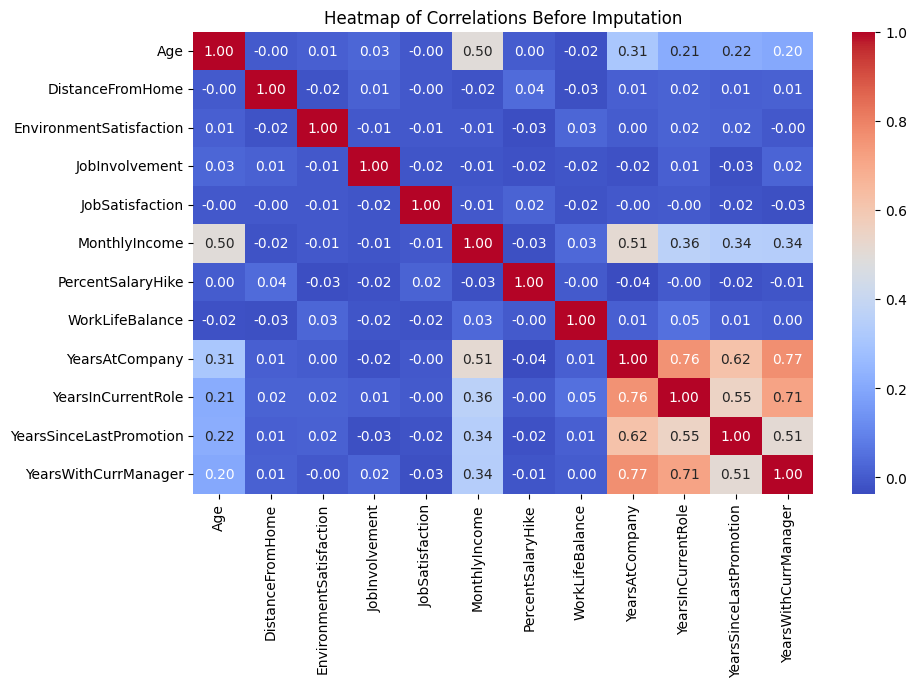

In [0]:
plt.figure(figsize=(10, 6))
sns.heatmap(pandas_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap of Correlations Before Imputation")
plt.show()

In [0]:
## Dispaly the dataframe with only the Null values 
Null_JobInvl_df = employee_df.filter(col("JobInvolvement").isNull())

## Select relevant columns: 'beds', 'Age', and 'YearsWithCurrManager'
filtered_df = Null_JobInvl_df .select("JobInvolvement", "Age", "YearsWithCurrManager")

##  Display the filtered dataset
display(filtered_df)

JobInvolvement,Age,YearsWithCurrManager
null,35,1
null,45,0
null,53,3
null,45,8
null,36,7
null,39,2
null,31,4
null,47,9
null,38,7
null,40,7


In [0]:
from pyspark.sql.functions import col

# Filter rows where 'beds' is not null
non_null_df = employee_df.filter(col("JobInvolvement").isNotNull())

# Select relevant columns: 'beds', 'Age', and 'YearsWithCurrManager'
filtered_non_null_df = non_null_df.select("JobInvolvement", "Age", "YearsWithCurrManager")

# Display the filtered dataset
display(filtered_non_null_df.show(20))


+--------------+---+--------------------+
|JobInvolvement|Age|YearsWithCurrManager|
+--------------+---+--------------------+
|           3.0| 41|                   5|
|           2.0| 49|                   7|
|           2.0| 37|                   0|
|           3.0| 33|                   0|
|           3.0| 27|                   2|
|           3.0| 32|                   6|
|           4.0| 59|                   0|
|           3.0| 30|                   0|
|           2.0| 38|                   8|
|           3.0| 36|                   7|
|           4.0| 35|                   3|
|           2.0| 29|                   8|
|           3.0| 31|                   3|
|           3.0| 34|                   2|
|           2.0| 28|                   3|
|           4.0| 29|                   8|
|           4.0| 32|                   5|
|           4.0| 22|                   0|
|           2.0| 53|                   7|
|           3.0| 38|                   2|
+--------------+---+--------------

In [0]:
# Step 2: Impute missing values with mean - 
mean_value = employee_df.select(mean(col("JobInvolvement"))).collect()[0][0]
imputed_df = employee_df.fillna({"JobInvolvement": mean_value})

In [0]:
pandas_df = imputed_df.toPandas()

/root/.ipykernel/5553/command-1717308180054729-445263768:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(pandas_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")


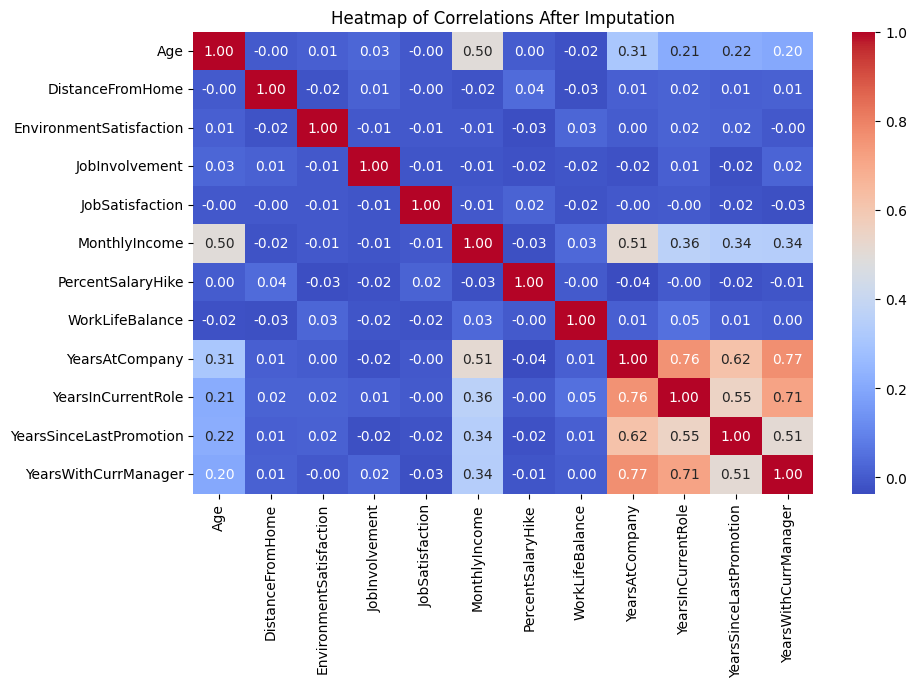

In [0]:
# Step 4: Visualize patterns using a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(pandas_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap of Correlations After Imputation")
plt.show()

The above heat map suggests that our pattern of sorts between **Job Involvement** and **AGE and Years with Current Manager** is not lost. Hence, we can use the mean imputation as a justified one for our dataset.

- No Bias will be concured with data imputation.
- No accuary will be incured while using this mechanism.

In [0]:
## Dispaly the dataframe with only the Null values 
Null_JobInvl_df = imputed_df.filter(col("JobInvolvement").isNull())

# Show the rows with empty values in Job Involvement
display(Null_JobInvl_df)  ## 25 records


Age,Department,DistanceFromHome,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition


Missing values are handled! 

In [0]:
employee_df = imputed_df

In [0]:
from pyspark.sql.functions import col, isnan, when, count
 
# Count null or NaN values for each column
null_counts = employee_df.select(
    [count(when(col(c).isNull() | isnan(col(c)), c)).alias(c) for c in employee_df.columns]
)
 
# Show the null counts for each column
display(null_counts)

Age,Department,DistanceFromHome,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Outliers Analysis 

We are checking for outliers/abnormalities in our dataset using functions in pyspark.

In [0]:
from pyspark.sql.functions import col, count
 
# Function to detect outliers in a single column
def detect_outliers(employee_df, column):
    # Calculate Q1, Q3, and IQR
    Q1, Q3 = employee_df.approxQuantile(column, [0.25, 0.75], 0.0)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Count outliers
    outliers = employee_df.filter((col(column) < lower_bound) | (col(column) > upper_bound))
    return outliers.count()
 
# List of numeric columns to check
numeric_columns = [col_name for col_name, dtype in employee_df.dtypes if dtype in ("int", "double")]
 
# Check for outliers in each numeric column
for column in numeric_columns:
    outlier_count = detect_outliers(employee_df, column)
    print(f"Column '{column}' has {outlier_count} outliers.")

Column 'Age' has 0 outliers.
Column 'DistanceFromHome' has 0 outliers.
Column 'EnvironmentSatisfaction' has 0 outliers.
Column 'JobInvolvement' has 0 outliers.
Column 'JobSatisfaction' has 0 outliers.
Column 'MonthlyIncome' has 114 outliers.
Column 'PercentSalaryHike' has 0 outliers.
Column 'WorkLifeBalance' has 0 outliers.
Column 'YearsAtCompany' has 104 outliers.
Column 'YearsInCurrentRole' has 21 outliers.
Column 'YearsSinceLastPromotion' has 107 outliers.
Column 'YearsWithCurrManager' has 14 outliers.


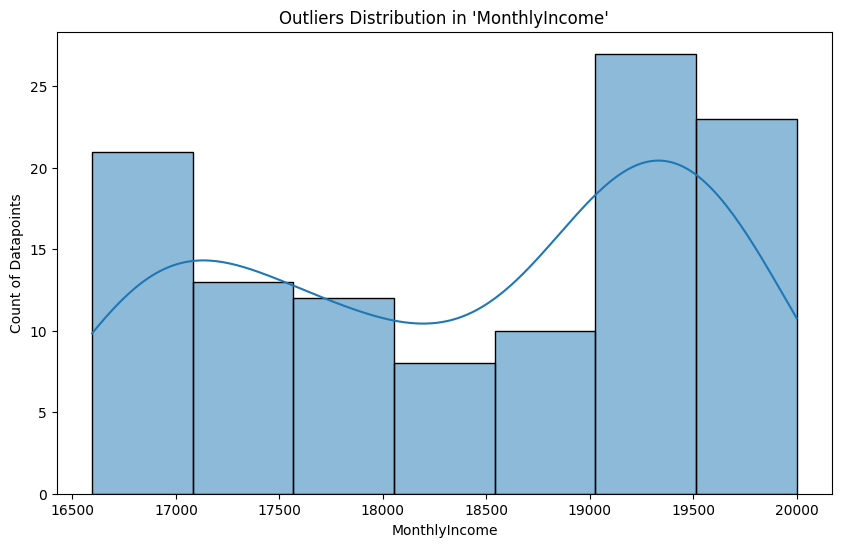

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.functions import col

# Function to detect outliers in a single column
def detect_outliers(employee_df, column):
    # Calculate Q1, Q3, and IQR
    Q1, Q3 = employee_df.approxQuantile(column, [0.25, 0.75], 0.0)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Filter outliers
    outliers = employee_df.filter((col(column) < lower_bound) | (col(column) > upper_bound))
    return outliers

# Manually specify the column you want to visualize (e.g., 'beds')
column_to_visualize = "MonthlyIncome"  # Replace with your column of interest

# Check if the column exists in the DataFrame
if column_to_visualize in [col_name for col_name, dtype in employee_df.dtypes if dtype in ("int", "double")]:
    # Detect outliers for the specified column
    outliers_df = detect_outliers(employee_df, column_to_visualize)
    
    # Convert outliers DataFrame to Pandas for visualization
    outliers_pandas_df = outliers_df.select(column_to_visualize).toPandas()
    
    # Skip visualization if no outliers are detected
    if outliers_pandas_df.empty:
        print(f"No outliers detected in column '{column_to_visualize}'.")
    else:
        # Visualize the outliers using a histogram
        plt.figure(figsize=(10, 6))
        sns.histplot(outliers_pandas_df[column_to_visualize], kde=True, bins=7)  # 'bins' controls the number of histogram bars
        plt.title(f"Outliers Distribution in '{column_to_visualize}'")
        plt.xlabel(column_to_visualize)
        plt.ylabel('Count of Datapoints')
        plt.show()
else:
    print(f"Column '{column_to_visualize}' not found in the dataset.")


We see **two peaks** : between **16500 - 17000**  and **19000 - 19500 **

And cannot be viewed as normal distribution

But the intresting fact is that, although, we have max outliners for employee's monthly income - we are not gonna handle it coz this is valuable information and handling this will lead to loss of data.

We will be applying scaling to handle the outliers here such that we don't loose the data.

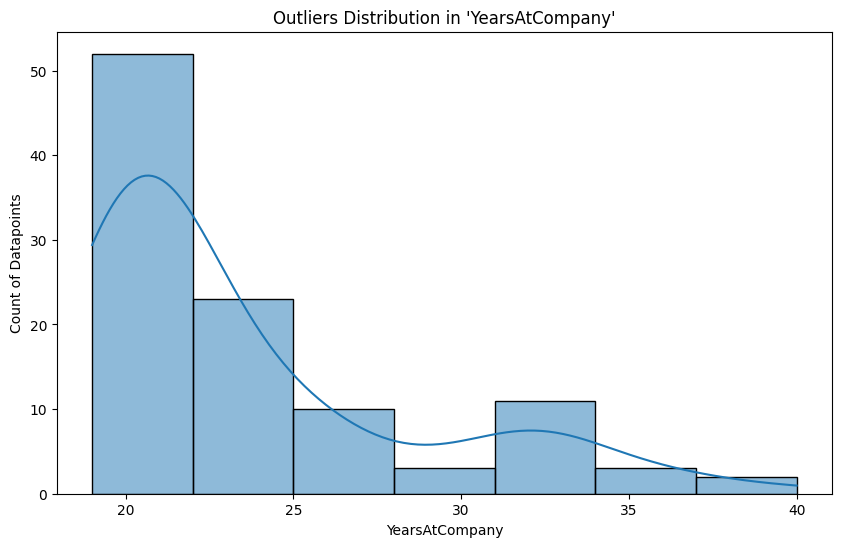

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.functions import col

# Function to detect outliers in a single column
def detect_outliers(employee_df, column):
    # Calculate Q1, Q3, and IQR
    Q1, Q3 = employee_df.approxQuantile(column, [0.25, 0.75], 0.0)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Filter outliers
    outliers = employee_df.filter((col(column) < lower_bound) | (col(column) > upper_bound))
    return outliers

# Manually specify the column you want to visualize (e.g., 'beds')
column_to_visualize = "YearsAtCompany"  # Replace with your column of interest

# Check if the column exists in the DataFrame
if column_to_visualize in [col_name for col_name, dtype in employee_df.dtypes if dtype in ("int", "double")]:
    # Detect outliers for the specified column
    outliers_df = detect_outliers(employee_df, column_to_visualize)
    
    # Convert outliers DataFrame to Pandas for visualization
    outliers_pandas_df = outliers_df.select(column_to_visualize).toPandas()
    
    # Skip visualization if no outliers are detected
    if outliers_pandas_df.empty:
        print(f"No outliers detected in column '{column_to_visualize}'.")
    else:
        # Visualize the outliers using a histogram
        plt.figure(figsize=(10, 6))
        sns.histplot(outliers_pandas_df[column_to_visualize], kde=True, bins=7)  # 'bins' controls the number of histogram bars
        plt.title(f"Outliers Distribution in '{column_to_visualize}'")
        plt.xlabel(column_to_visualize)
        plt.ylabel('Count of Datapoints')
        plt.show()
else:
    print(f"Column '{column_to_visualize}' not found in the dataset.")


It is rightly skewed - and based on reality of the data collection - we will not impute it but scale it to reason out these valid datapoints.

In [0]:
display(employee_df.printSchema())

root
 |-- Age: integer (nullable = true)
 |-- Department: string (nullable = true)
 |-- DistanceFromHome: integer (nullable = true)
 |-- EnvironmentSatisfaction: integer (nullable = true)
 |-- Gender: string (nullable = true)
 |-- JobInvolvement: double (nullable = false)
 |-- JobSatisfaction: integer (nullable = true)
 |-- MaritalStatus: string (nullable = true)
 |-- MonthlyIncome: integer (nullable = true)
 |-- OverTime: string (nullable = true)
 |-- PercentSalaryHike: integer (nullable = true)
 |-- WorkLifeBalance: integer (nullable = true)
 |-- YearsAtCompany: integer (nullable = true)
 |-- YearsInCurrentRole: integer (nullable = true)
 |-- YearsSinceLastPromotion: integer (nullable = true)
 |-- YearsWithCurrManager: integer (nullable = true)
 |-- Attrition: string (nullable = true)



## Data Conversion and Preparation 

Columns with **strings** in our dataset are : **Department**, **Job Role** , **Gender**, **Marital status**, **Over Time**, **Attrition**

In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml import Pipeline
from pyspark.sql import functions as F

# Step 1: Use StringIndexer to convert the 'Department' column to numeric indices
indexer = StringIndexer(inputCol="Department", outputCol="Department_index")

# Step 2: Use OneHotEncoder to convert the numeric indices into one-hot encoded vectors
encoder = OneHotEncoder(inputCol="Department_index", outputCol="Department_onehot")

# Step 3: Create a pipeline to apply both transformations
pipeline = Pipeline(stages=[indexer, encoder])

# Step 4: Apply the pipeline to the DataFrame
encoded_df = pipeline.fit(employee_df).transform(employee_df)

# Step 5: Convert the OneHotEncoded vector column into separate columns (manually)
encoded_df = encoded_df.withColumn("Sales", F.when(F.col("Department_index") == 0, 1).otherwise(0)) \
                       .withColumn("Research_and_Development", F.when(F.col("Department_index") == 1, 1).otherwise(0)) \
                       .withColumn("Human_Resources", F.when(F.col("Department_index") == 2, 1).otherwise(0))

# Step 6: Show the result with 0 and 1 columns for each department
display(encoded_df)


Age,Department,DistanceFromHome,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Department_index,Department_onehot,Sales,Research_and_Development,Human_Resources
41,Sales,1,2,Female,3.0,4,Single,5993,Yes,11,1,6,4,0,5,Yes,1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0,1,0
49,Research & Development,8,3,Male,2.0,2,Married,5130,No,23,3,10,7,1,7,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
37,Research & Development,2,4,Male,2.0,3,Single,2090,Yes,15,3,0,0,0,0,Yes,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
33,Research & Development,3,4,Female,3.0,3,Married,2909,Yes,11,3,8,7,3,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
27,Research & Development,2,1,Male,3.0,2,Married,3468,No,12,3,2,2,2,2,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
32,Research & Development,2,4,Male,3.0,4,Single,3068,No,13,2,7,7,3,6,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
59,Research & Development,3,3,Female,4.0,1,Married,2670,Yes,20,2,1,0,0,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
30,Research & Development,24,4,Male,3.0,3,Divorced,2693,No,22,3,1,0,0,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
38,Research & Development,23,4,Male,2.0,3,Single,9526,No,21,3,9,7,1,8,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
36,Research & Development,27,3,Male,3.0,3,Married,5237,No,13,2,7,7,7,7,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0


In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml import Pipeline
from pyspark.sql import functions as F

# Step 1: Use StringIndexer to convert the 'Gender' column to numeric indices
indexer_gender = StringIndexer(inputCol="Gender", outputCol="Gender_index")

# Step 2: Use OneHotEncoder to convert the numeric indices into one-hot encoded vectors
encoder_gender = OneHotEncoder(inputCol="Gender_index", outputCol="Gender_onehot")

# Step 3: Create a pipeline to apply both transformations
pipeline_gender = Pipeline(stages=[indexer_gender, encoder_gender])

# Step 4: Apply the pipeline to the DataFrame
encoded_gender_df = pipeline_gender.fit(encoded_df).transform(encoded_df)

# Step 5: Convert the OneHotEncoded vector column into separate columns (manually)
encoded_gender_df = encoded_gender_df.withColumn("Female", F.when(F.col("Gender_index") == 0, 1).otherwise(0)) \
                                     .withColumn("Male", F.when(F.col("Gender_index") == 1, 1).otherwise(0))

# Step 6: Show the result with 0 and 1 columns for each gender
display(encoded_gender_df)


Age,Department,DistanceFromHome,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Department_index,Department_onehot,Sales,Research_and_Development,Human_Resources,Gender_index,Gender_onehot,Female,Male
41,Sales,1,2,Female,3.0,4,Single,5993,Yes,11,1,6,4,0,5,Yes,1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0,1,0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0,1
49,Research & Development,8,3,Male,2.0,2,Married,5130,No,23,3,10,7,1,7,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0
37,Research & Development,2,4,Male,2.0,3,Single,2090,Yes,15,3,0,0,0,0,Yes,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0
33,Research & Development,3,4,Female,3.0,3,Married,2909,Yes,11,3,8,7,3,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0,1
27,Research & Development,2,1,Male,3.0,2,Married,3468,No,12,3,2,2,2,2,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0
32,Research & Development,2,4,Male,3.0,4,Single,3068,No,13,2,7,7,3,6,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0
59,Research & Development,3,3,Female,4.0,1,Married,2670,Yes,20,2,1,0,0,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0,1
30,Research & Development,24,4,Male,3.0,3,Divorced,2693,No,22,3,1,0,0,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0
38,Research & Development,23,4,Male,2.0,3,Single,9526,No,21,3,9,7,1,8,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0
36,Research & Development,27,3,Male,3.0,3,Married,5237,No,13,2,7,7,7,7,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0


In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml import Pipeline
from pyspark.sql import functions as F

# Step 1: Use StringIndexer to convert the 'Marital Status' column to numeric indices
indexer_MaritalStatus = StringIndexer(inputCol="MaritalStatus", outputCol="MaritalStatus_index")

# Step 2: Use OneHotEncoder to convert the numeric indices into one-hot encoded vectors
encoder_MaritalStatus = OneHotEncoder(inputCol="MaritalStatus_index", outputCol="MaritalStatus_onehot")

# Step 3: Create a pipeline to apply both transformations
pipeline_MaritalStatus = Pipeline(stages=[indexer_MaritalStatus, encoder_MaritalStatus])

# Step 4: Apply the pipeline to the DataFrame
encoded_MaritalStatus_df = pipeline_MaritalStatus.fit(encoded_gender_df).transform(encoded_gender_df)

# Step 5: Convert the OneHotEncoded vector column into separate columns (manually)
encoded_MaritalStatus_df = encoded_MaritalStatus_df.withColumn("Single", F.when(F.col("MaritalStatus_index") == 0, 1).otherwise(0)) \
                       .withColumn("Married", F.when(F.col("MaritalStatus_index") == 1, 1).otherwise(0)) \
                       .withColumn("Divorced", F.when(F.col("MaritalStatus_index") == 2, 1).otherwise(0))

# Step 6: Show the result with 0 and 1 columns for each gender
display(encoded_MaritalStatus_df)


Age,Department,DistanceFromHome,EnvironmentSatisfaction,Gender,JobInvolvement,JobSatisfaction,MaritalStatus,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Department_index,Department_onehot,Sales,Research_and_Development,Human_Resources,Gender_index,Gender_onehot,Female,Male,MaritalStatus_index,MaritalStatus_onehot,Single,Married,Divorced
41,Sales,1,2,Female,3.0,4,Single,5993,Yes,11,1,6,4,0,5,Yes,1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0,1,0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0,1,1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0,1,0
49,Research & Development,8,3,Male,2.0,2,Married,5130,No,23,3,10,7,1,7,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
37,Research & Development,2,4,Male,2.0,3,Single,2090,Yes,15,3,0,0,0,0,Yes,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0,1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0,1,0
33,Research & Development,3,4,Female,3.0,3,Married,2909,Yes,11,3,8,7,3,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0,1,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
27,Research & Development,2,1,Male,3.0,2,Married,3468,No,12,3,2,2,2,2,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
32,Research & Development,2,4,Male,3.0,4,Single,3068,No,13,2,7,7,3,6,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0,1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0,1,0
59,Research & Development,3,3,Female,4.0,1,Married,2670,Yes,20,2,1,0,0,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0,1,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0
30,Research & Development,24,4,Male,3.0,3,Divorced,2693,No,22,3,1,0,0,0,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0,2.0,"Map(vectorType -> sparse, length -> 2, indices -> List(), values -> List())",0,0,1
38,Research & Development,23,4,Male,2.0,3,Single,9526,No,21,3,9,7,1,8,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0,1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0,1,0
36,Research & Development,27,3,Male,3.0,3,Married,5237,No,13,2,7,7,7,7,No,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0,0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",1,0,0.0,"Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))",1,0,0


In [0]:
encoded_MaritalStatus_df.printSchema()

root
 |-- Age: integer (nullable = true)
 |-- Department: string (nullable = true)
 |-- DistanceFromHome: integer (nullable = true)
 |-- EnvironmentSatisfaction: integer (nullable = true)
 |-- Gender: string (nullable = true)
 |-- JobInvolvement: double (nullable = false)
 |-- JobSatisfaction: integer (nullable = true)
 |-- MaritalStatus: string (nullable = true)
 |-- MonthlyIncome: integer (nullable = true)
 |-- OverTime: string (nullable = true)
 |-- PercentSalaryHike: integer (nullable = true)
 |-- WorkLifeBalance: integer (nullable = true)
 |-- YearsAtCompany: integer (nullable = true)
 |-- YearsInCurrentRole: integer (nullable = true)
 |-- YearsSinceLastPromotion: integer (nullable = true)
 |-- YearsWithCurrManager: integer (nullable = true)
 |-- Attrition: string (nullable = true)
 |-- Department_index: double (nullable = false)
 |-- Department_onehot: vector (nullable = true)
 |-- Sales: integer (nullable = false)
 |-- Research_and_Development: integer (nullable = false)
 |-- Hu

Now that we have imputed my dataset, we can drop the  orginal columns. 
So let's go ahead and do that

In [0]:
# List of columns to drop
columns_to_drop = ["Department_index", "Department_onehot", "Department", "MaritalStatus_onehot", "MaritalStatus_index", "MaritalStatus", "Gender_index", "Gender_onehot", "Gender"]  # Replace with your column names

# Drop the specified columns from the DataFrame
encoded_df = encoded_MaritalStatus_df.drop(*columns_to_drop)

# Show the DataFrame after dropping the columns
encoded_df.printSchema()


root
 |-- Age: integer (nullable = true)
 |-- DistanceFromHome: integer (nullable = true)
 |-- EnvironmentSatisfaction: integer (nullable = true)
 |-- JobInvolvement: double (nullable = false)
 |-- JobSatisfaction: integer (nullable = true)
 |-- MonthlyIncome: integer (nullable = true)
 |-- OverTime: string (nullable = true)
 |-- PercentSalaryHike: integer (nullable = true)
 |-- WorkLifeBalance: integer (nullable = true)
 |-- YearsAtCompany: integer (nullable = true)
 |-- YearsInCurrentRole: integer (nullable = true)
 |-- YearsSinceLastPromotion: integer (nullable = true)
 |-- YearsWithCurrManager: integer (nullable = true)
 |-- Attrition: string (nullable = true)
 |-- Sales: integer (nullable = false)
 |-- Research_and_Development: integer (nullable = false)
 |-- Human_Resources: integer (nullable = false)
 |-- Female: integer (nullable = false)
 |-- Male: integer (nullable = false)
 |-- Single: integer (nullable = false)
 |-- Married: integer (nullable = false)
 |-- Divorced: integer

Post one-hot encoding, we have few more string values left - which we will map - as it's ordinal data or TRUE or FALSE like data.

In [0]:
from pyspark.sql.functions import when, col, trim, lower

# Define mappings for string columns
overtime_mapping = {
    "yes": 1,
    "no": 0
}

attrition_mapping = {
    "yes": 1,
    "no": 0
}

# JobInvolvement needs mapping, define its mapping
job_involvement_mapping = {
    "low": 0,
    "medium": 1,
    "high": 2,
    "very high": 3
}


# Generic function to map string values to integers
def map_column(df, column, mapping):
    df = df.withColumn(column, trim(lower(col(column)))) # Clean the column
    for key, value in mapping.items():
        df = df.withColumn(column, when(col(column) == key, value).otherwise(col(column)))
    df = df.withColumn(column, col(column).cast("int")) # Cast to integer
    return df

# Apply mappings to columns
encoded_df = map_column(encoded_df, "OverTime", overtime_mapping)
encoded_df = map_column(encoded_df, "Attrition", attrition_mapping)
encoded_df = map_column(encoded_df, "JobInvolvement", job_involvement_mapping)

# Show the schema to verify changes
encoded_df.printSchema()

root
 |-- Age: integer (nullable = true)
 |-- DistanceFromHome: integer (nullable = true)
 |-- EnvironmentSatisfaction: integer (nullable = true)
 |-- JobInvolvement: integer (nullable = true)
 |-- JobSatisfaction: integer (nullable = true)
 |-- MonthlyIncome: integer (nullable = true)
 |-- OverTime: integer (nullable = true)
 |-- PercentSalaryHike: integer (nullable = true)
 |-- WorkLifeBalance: integer (nullable = true)
 |-- YearsAtCompany: integer (nullable = true)
 |-- YearsInCurrentRole: integer (nullable = true)
 |-- YearsSinceLastPromotion: integer (nullable = true)
 |-- YearsWithCurrManager: integer (nullable = true)
 |-- Attrition: integer (nullable = true)
 |-- Sales: integer (nullable = false)
 |-- Research_and_Development: integer (nullable = false)
 |-- Human_Resources: integer (nullable = false)
 |-- Female: integer (nullable = false)
 |-- Male: integer (nullable = false)
 |-- Single: integer (nullable = false)
 |-- Married: integer (nullable = false)
 |-- Divorced: integ

In [0]:
display(encoded_df)



Age,DistanceFromHome,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Sales,Research_and_Development,Human_Resources,Female,Male,Single,Married,Divorced
41,1,2,3,4,5993,1,11,1,6,4,0,5,1,0,1,0,0,1,0,1,0
49,8,3,2,2,5130,0,23,3,10,7,1,7,0,1,0,0,1,0,1,0,0
37,2,4,2,3,2090,1,15,3,0,0,0,0,1,1,0,0,1,0,0,1,0
33,3,4,3,3,2909,1,11,3,8,7,3,0,0,1,0,0,0,1,1,0,0
27,2,1,3,2,3468,0,12,3,2,2,2,2,0,1,0,0,1,0,1,0,0
32,2,4,3,4,3068,0,13,2,7,7,3,6,0,1,0,0,1,0,0,1,0
59,3,3,4,1,2670,1,20,2,1,0,0,0,0,1,0,0,0,1,1,0,0
30,24,4,3,3,2693,0,22,3,1,0,0,0,0,1,0,0,1,0,0,0,1
38,23,4,2,3,9526,0,21,3,9,7,1,8,0,1,0,0,1,0,0,1,0
36,27,3,3,3,5237,0,13,2,7,7,7,7,0,1,0,0,1,0,1,0,0


# STATS ANALYSIS

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

data = encoded_df


# Assemble features into a single vector  -- I pull it into a single vector and call that colunm as raw_feautres 
feature_columns = [col for col in data.columns if col != "Attrition"]
assembler = VectorAssembler(inputCols=feature_columns, outputCol="raw_features")
data = assembler.transform(data)


display(data) ## final coln has the vector 


Age,DistanceFromHome,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Sales,Research_and_Development,Human_Resources,Female,Male,Single,Married,Divorced,raw_features
41,1,2,3,4,5993,1,11,1,6,4,0,5,1,0,1,0,0,1,0,1,0,"Map(vectorType -> dense, length -> 21, values -> List(41.0, 1.0, 2.0, 3.0, 4.0, 5993.0, 1.0, 11.0, 1.0, 6.0, 4.0, 0.0, 5.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0))"
49,8,3,2,2,5130,0,23,3,10,7,1,7,0,1,0,0,1,0,1,0,0,"Map(vectorType -> dense, length -> 21, values -> List(49.0, 8.0, 3.0, 2.0, 2.0, 5130.0, 0.0, 23.0, 3.0, 10.0, 7.0, 1.0, 7.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0))"
37,2,4,2,3,2090,1,15,3,0,0,0,0,1,1,0,0,1,0,0,1,0,"Map(vectorType -> sparse, length -> 21, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 13, 16, 19), values -> List(37.0, 2.0, 4.0, 2.0, 3.0, 2090.0, 1.0, 15.0, 3.0, 1.0, 1.0, 1.0))"
33,3,4,3,3,2909,1,11,3,8,7,3,0,0,1,0,0,0,1,1,0,0,"Map(vectorType -> dense, length -> 21, values -> List(33.0, 3.0, 4.0, 3.0, 3.0, 2909.0, 1.0, 11.0, 3.0, 8.0, 7.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0))"
27,2,1,3,2,3468,0,12,3,2,2,2,2,0,1,0,0,1,0,1,0,0,"Map(vectorType -> dense, length -> 21, values -> List(27.0, 2.0, 1.0, 3.0, 2.0, 3468.0, 0.0, 12.0, 3.0, 2.0, 2.0, 2.0, 2.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0))"
32,2,4,3,4,3068,0,13,2,7,7,3,6,0,1,0,0,1,0,0,1,0,"Map(vectorType -> dense, length -> 21, values -> List(32.0, 2.0, 4.0, 3.0, 4.0, 3068.0, 0.0, 13.0, 2.0, 7.0, 7.0, 3.0, 6.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0))"
59,3,3,4,1,2670,1,20,2,1,0,0,0,0,1,0,0,0,1,1,0,0,"Map(vectorType -> dense, length -> 21, values -> List(59.0, 3.0, 3.0, 4.0, 1.0, 2670.0, 1.0, 20.0, 2.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0))"
30,24,4,3,3,2693,0,22,3,1,0,0,0,0,1,0,0,1,0,0,0,1,"Map(vectorType -> sparse, length -> 21, indices -> List(0, 1, 2, 3, 4, 5, 7, 8, 9, 13, 16, 20), values -> List(30.0, 24.0, 4.0, 3.0, 3.0, 2693.0, 22.0, 3.0, 1.0, 1.0, 1.0, 1.0))"
38,23,4,2,3,9526,0,21,3,9,7,1,8,0,1,0,0,1,0,0,1,0,"Map(vectorType -> dense, length -> 21, values -> List(38.0, 23.0, 4.0, 2.0, 3.0, 9526.0, 0.0, 21.0, 3.0, 9.0, 7.0, 1.0, 8.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0))"
36,27,3,3,3,5237,0,13,2,7,7,7,7,0,1,0,0,1,0,1,0,0,"Map(vectorType -> dense, length -> 21, values -> List(36.0, 27.0, 3.0, 3.0, 3.0, 5237.0, 0.0, 13.0, 2.0, 7.0, 7.0, 7.0, 7.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0))"


In [0]:
# Scale the features using StandardScaler -- where in i scale the last coln 
scaler = StandardScaler(inputCol="raw_features", outputCol="features", withStd=True, withMean=True)
scaler_model = scaler.fit(data)
data = scaler_model.transform(data).select("features", "Attrition")


display(data)  ## we can see that the data has been scaled and the Y label has been added

features,Attrition
"Map(vectorType -> dense, length -> 21, values -> List(0.4461985578408614, -1.0105654376999094, -0.6603059658454007, 0.4022589761442781, 1.1528612603786443, -0.10831265366490042, 1.591204032206066, -1.1501626900645183, -2.4929720391262866, -0.16455710867531384, -0.06327436651899006, -0.67891464284095, 0.245750363404438, -1.3735833985087844, 1.514728439425039, -0.21153169847049633, -1.224328220632333, 1.224328220632333, -0.9186088008899419, 1.4581536911459163, -0.5346911447885758))",1
"Map(vectorType -> dense, length -> 21, values -> List(1.321915353603306, -0.14709966057360627, 0.2545383035162757, -1.0090075988726406, -0.6606283626888919, -0.29161934906581216, -0.6280273979105537, 2.1285816300288958, 0.33798114551306047, 0.4883415411295779, 0.764737373388254, -0.3685898527364115, 0.8062670960724382, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(0.008340159959639187, -0.8872131838247231, 1.169382572877952, -1.0090075988726406, 0.2461164488448762, -0.9373347071408663, 1.591204032206066, -0.057247916700046926, 0.33798114551306047, -1.1439050833826514, -1.1672900197286489, -0.67891464284095, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, -0.9186088008899419, 1.4581536911459163, -0.5346911447885758))",1
"Map(vectorType -> dense, length -> 21, values -> List(-0.42951823792158306, -0.763860929949537, 1.169382572877952, 0.4022589761442781, 0.2461164488448762, -0.7633738919226198, 1.591204032206066, -1.1501626900645183, 0.33798114551306047, 0.16189221622713204, 0.764737373388254, 0.25205972747266575, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, -1.224328220632333, 1.224328220632333, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(-1.0863058347434165, -0.8872131838247231, -1.5751502352070772, 0.4022589761442781, -0.6606283626888919, -0.6446387323292134, -0.6280273979105537, -0.8769339967234004, 0.33798114551306047, -0.8174557584802056, -0.6152821931238195, -0.058265062631872845, -0.5950247355975622, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(-0.5389828373918886, -0.8872131838247231, 1.169382572877952, 0.4022589761442781, 1.1528612603786443, -0.7296012794443522, -0.6280273979105537, -0.6037053033822826, -1.0774954468066131, -0.001332446224090907, 0.764737373388254, 0.25205972747266575, 0.5260087297384382, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, -0.9186088008899419, 1.4581536911459163, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(2.4165613483063613, -0.763860929949537, 0.2545383035162757, 1.8135255511611967, -1.56737317422266, -0.8141390138239152, 1.591204032206066, 1.3088955500055421, -1.0774954468066131, -0.9806804209314286, -1.1672900197286489, -0.67891464284095, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, -1.224328220632333, 1.224328220632333, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(-0.7579120363324997, 1.826536401429372, 1.169382572877952, 0.4022589761442781, 0.2461164488448762, -0.8092536673647948, -0.6280273979105537, 1.855352936687778, 0.33798114551306047, -0.9806804209314286, -1.1672900197286489, -0.67891464284095, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, -0.9186088008899419, -0.6853322348385807, 1.8689662950866732))",0
"Map(vectorType -> dense, length -> 21, values -> Lis

## Logistic Regression

In [0]:
# Split the dataset into training and testing
train_data, test_data = data.randomSplit([0.8, 0.2], seed=42)

# Train Logistic Regression model
lr = LogisticRegression(labelCol="Attrition", featuresCol="features")
lr_model = lr.fit(train_data)

# Make predictions
predictions = lr_model.transform(test_data)
predictions.select("Attrition", "prediction", "probability").show(5)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol="Attrition", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print(f"Accuracy: {accuracy:.2f}")

# Create a confusion matrix
confusion_matrix = predictions.groupBy("Attrition", "prediction").count().withColumnRenamed("count", "frequency")
confusion_matrix.show()

+---------+----------+--------------------+
|Attrition|prediction|         probability|
+---------+----------+--------------------+
|        1|       0.0|[0.75839794515905...|
|        0|       0.0|[0.55708868125119...|
|        1|       1.0|[0.41626619014679...|
|        1|       1.0|[0.24493820343363...|
|        0|       0.0|[0.73826448876833...|
+---------+----------+--------------------+
only showing top 5 rows

Accuracy: 0.86
+---------+----------+---------+
|Attrition|prediction|frequency|
+---------+----------+---------+
|        1|       0.0|       26|
|        0|       0.0|      205|
|        1|       1.0|       13|
|        0|       1.0|       10|
+---------+----------+---------+



Insights
True Positives (TP): 13 cases where Attrition is 1 and was predicted correctly as 1.
True Negatives (TN): 205 cases where Attrition is 0 and was predicted correctly as 0.
False Positives (FP): 10 cases where Attrition is 0 but was incorrectly predicted as 1.
False Negatives (FN): 26 cases where Attrition is 1 but was incorrectly predicted as 0.


In [0]:
from pyspark.sql import functions as F

# Calculate confusion matrix values
tp = predictions.filter((F.col("Attrition") == 1) & (F.col("prediction") == 1)).count()
tn = predictions.filter((F.col("Attrition") == 0) & (F.col("prediction") == 0)).count()
fp = predictions.filter((F.col("Attrition") == 0) & (F.col("prediction") == 1)).count()
fn = predictions.filter((F.col("Attrition") == 1) & (F.col("prediction") == 0)).count()

# Print confusion matrix
print("Confusion Matrix:")
print(f"                Predicted 0     Predicted 1")
print(f"Actual 0       {tn}              {fp}")
print(f"Actual 1       {fn}              {tp}")


Confusion Matrix:
                Predicted 0     Predicted 1
Actual 0       205              10
Actual 1       26              13


In [0]:
data.printSchema()


root
 |-- features: vector (nullable = true)
 |-- Attrition: integer (nullable = true)



## Random Forest Classifier

In [0]:
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Define target column
target_column = "Attrition"

# Train a Random Forest classifier
rf = RandomForestClassifier(featuresCol="features", labelCol=target_column, numTrees=50)
rf_model = rf.fit(data)

# Make predictions
predictions = rf_model.transform(data)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol=target_column, metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print(f"Test Accuracy: {accuracy}")

# Extract feature importances
importances = rf_model.featureImportances.toArray()

# Since the `features` column does not contain individual feature names, map them manually if known
# Replace `feature_columns` with the original list of feature names, if available
feature_columns = [
    "Age",
    "DistanceFromHome",
    "EnvironmentSatisfaction",
    "JobInvolvement",
    "JobSatisfaction",
    "MonthlyIncome",
    "OverTime",
    "PercentSalaryHike",
    "WorkLifeBalance",
    "YearsAtCompany",
    "YearsInCurrentRole",
    "YearsSinceLastPromotion",
    "YearsWithCurrManager",
    "Sales",
    "Research_and_Development",
    "Human_Resources",
    "Female",
    "Male",
    "Single",
    "Married",
    "Divorced"
]

# Pair feature names with their importances
feature_importances = [(feature, float(importance)) for feature, importance in zip(feature_columns, importances)]

# Create a DataFrame for feature importances
importance_df = spark.createDataFrame(feature_importances, ["Feature", "Importance"])
sorted_importance_df = importance_df.orderBy("Importance", ascending=False)

# Show the most important features
sorted_importance_df.show(truncate=False)


Test Accuracy: 0.8673469387755102
+------------------------+--------------------+
|Feature                 |Importance          |
+------------------------+--------------------+
|Age                     |0.159631879749141   |
|OverTime                |0.15376581964303918 |
|MonthlyIncome           |0.12265703117395016 |
|YearsAtCompany          |0.10404101405959873 |
|YearsWithCurrManager    |0.06715334958375072 |
|Married                 |0.05882049698039908 |
|DistanceFromHome        |0.04858428672645419 |
|YearsInCurrentRole      |0.03969275798668171 |
|PercentSalaryHike       |0.03847867501708954 |
|EnvironmentSatisfaction |0.03550140460818457 |
|JobSatisfaction         |0.03483479653105935 |
|WorkLifeBalance         |0.0329761699437265  |
|YearsSinceLastPromotion |0.027426744708830227|
|JobInvolvement          |0.024869226515292126|
|Divorced                |0.010105056675721277|
|Research_and_Development|0.008989084537459847|
|Sales                   |0.008353597097750272|
|Femal

## Clustering Analysis

In [0]:
display(data)

features,Attrition
"Map(vectorType -> dense, length -> 21, values -> List(0.4461985578408614, -1.0105654376999094, -0.6603059658454007, 0.4022589761442781, 1.1528612603786443, -0.10831265366490042, 1.591204032206066, -1.1501626900645183, -2.4929720391262866, -0.16455710867531384, -0.06327436651899006, -0.67891464284095, 0.245750363404438, -1.3735833985087844, 1.514728439425039, -0.21153169847049633, -1.224328220632333, 1.224328220632333, -0.9186088008899419, 1.4581536911459163, -0.5346911447885758))",1
"Map(vectorType -> dense, length -> 21, values -> List(1.321915353603306, -0.14709966057360627, 0.2545383035162757, -1.0090075988726406, -0.6606283626888919, -0.29161934906581216, -0.6280273979105537, 2.1285816300288958, 0.33798114551306047, 0.4883415411295779, 0.764737373388254, -0.3685898527364115, 0.8062670960724382, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(0.008340159959639187, -0.8872131838247231, 1.169382572877952, -1.0090075988726406, 0.2461164488448762, -0.9373347071408663, 1.591204032206066, -0.057247916700046926, 0.33798114551306047, -1.1439050833826514, -1.1672900197286489, -0.67891464284095, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, -0.9186088008899419, 1.4581536911459163, -0.5346911447885758))",1
"Map(vectorType -> dense, length -> 21, values -> List(-0.42951823792158306, -0.763860929949537, 1.169382572877952, 0.4022589761442781, 0.2461164488448762, -0.7633738919226198, 1.591204032206066, -1.1501626900645183, 0.33798114551306047, 0.16189221622713204, 0.764737373388254, 0.25205972747266575, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, -1.224328220632333, 1.224328220632333, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(-1.0863058347434165, -0.8872131838247231, -1.5751502352070772, 0.4022589761442781, -0.6606283626888919, -0.6446387323292134, -0.6280273979105537, -0.8769339967234004, 0.33798114551306047, -0.8174557584802056, -0.6152821931238195, -0.058265062631872845, -0.5950247355975622, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(-0.5389828373918886, -0.8872131838247231, 1.169382572877952, 0.4022589761442781, 1.1528612603786443, -0.7296012794443522, -0.6280273979105537, -0.6037053033822826, -1.0774954468066131, -0.001332446224090907, 0.764737373388254, 0.25205972747266575, 0.5260087297384382, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, -0.9186088008899419, 1.4581536911459163, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(2.4165613483063613, -0.763860929949537, 0.2545383035162757, 1.8135255511611967, -1.56737317422266, -0.8141390138239152, 1.591204032206066, 1.3088955500055421, -1.0774954468066131, -0.9806804209314286, -1.1672900197286489, -0.67891464284095, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, -1.224328220632333, 1.224328220632333, 1.0878621312173606, -0.6853322348385807, -0.5346911447885758))",0
"Map(vectorType -> dense, length -> 21, values -> List(-0.7579120363324997, 1.826536401429372, 1.169382572877952, 0.4022589761442781, 0.2461164488448762, -0.8092536673647948, -0.6280273979105537, 1.855352936687778, 0.33798114551306047, -0.9806804209314286, -1.1672900197286489, -0.67891464284095, -1.1555414682655625, 0.7275275232476288, -0.6597352382652025, -0.21153169847049633, 0.8162188137548887, -0.8162188137548887, -0.9186088008899419, -0.6853322348385807, 1.8689662950866732))",0
"Map(vectorType -> dense, length -> 21, values -> Lis

In [0]:
## Checking for OPTIMAL CLUSTER NUMBER


from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

# Finding the best k score using Silhouette Scores
silhouette_scores = []

# Test for k values between 2 and 10 (adjust the range as needed)
for k in range(2, 11):
    kmeans = KMeans().setK(k).setSeed(42).setFeaturesCol("features").setPredictionCol("prediction")
    model = kmeans.fit(data)
    
    # Make predictions
    predictions = model.transform(data)
    
    # Evaluate clustering by computing Silhouette Score
    evaluator = ClusteringEvaluator(featuresCol="features", metricName="silhouette")
    silhouette = evaluator.evaluate(predictions)
    silhouette_scores.append((k, silhouette))
    print(f"For k = {k}, Silhouette Score = {silhouette:.4f}")

# Step 4: Determine Optimal k
optimal_k = max(silhouette_scores, key=lambda x: x[1])[0]
print(f"The optimal number of clusters is {optimal_k}")    


For k = 2, Silhouette Score = 0.2301
For k = 3, Silhouette Score = 0.1820
For k = 4, Silhouette Score = 0.1856
For k = 5, Silhouette Score = 0.1768
For k = 6, Silhouette Score = 0.1974
For k = 7, Silhouette Score = 0.1628
For k = 8, Silhouette Score = 0.1950
For k = 9, Silhouette Score = 0.1850
For k = 10, Silhouette Score = 0.1709
The optimal number of clusters is 2


In [0]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

# Step 1: Ensure "features" column exists from the VectorAssembler step
# The "features" column was already created in the previous workflow

# Step 2: Train a KMeans clustering model
kmeans = KMeans(featuresCol="features", k=2, seed=42)  # k is the number of clusters whose optimal val is 2
kmeans_model = kmeans.fit(data)  ## teaching the model to cluster our dataset 

# Step 3: Assign clusters to data points
clustered_data = kmeans_model.transform(data) ## calling the model to label the dataset 

# Step 5: Analyze cluster centers
centers = kmeans_model.clusterCenters()
print("Cluster Centers:")
for idx, center in enumerate(centers):
    print(f"Cluster {idx}: {center}")

# Step 6: Show clustered data
clustered_data.select("features", "prediction").show(20)


Cluster Centers:
Cluster 0: [ 3.57690521e-01  3.52908411e-02  4.02672425e-02  2.57296048e-02
  5.01255497e-04  6.12177100e-01 -5.85301266e-02 -4.93936848e-03
  5.54623959e-02  1.03419673e+00  1.08908413e+00  8.70181203e-01
  1.06940173e+00 -1.24042891e-01  1.41849132e-01 -3.05880867e-02
 -3.57407424e-02  3.57407424e-02  1.19361905e-01 -1.74562676e-01
  5.27607753e-02]
Cluster 1: [-1.79393305e-01 -1.76994923e-02 -2.01953177e-02 -1.29042247e-02
 -2.51395760e-04 -3.07026513e-01  2.93547418e-02  2.47725222e-03
 -2.78161761e-02 -5.18682934e-01 -5.46210734e-01 -4.36423872e-01
 -5.36339378e-01  6.22115010e-02 -7.11419037e-02  1.53409097e-02
  1.79251323e-02 -1.79251323e-02 -5.98638361e-02  8.75487987e-02
 -2.64612264e-02]
+--------------------+----------+
|            features|prediction|
+--------------------+----------+
|[0.44619855784086...|         1|
|[1.32191535360330...|         0|
|[0.00834015995963...|         1|
|[-0.4295182379215...|         1|
|[-1.0863058347434...|         1|
|[-

In [0]:
clustered_data.printSchema()

root
 |-- features: vector (nullable = true)
 |-- Attrition: integer (nullable = true)
 |-- prediction: integer (nullable = false)



In [0]:
# Select only the prediction column and create a new DataFrame
cluster_label_df = clustered_data.select(clustered_data["prediction"], clustered_data["Attrition"])

# Show the new DataFrame
cluster_label_df.show()  ## 1470 count


+----------+---------+
|prediction|Attrition|
+----------+---------+
|         1|        1|
|         0|        0|
|         1|        1|
|         1|        0|
|         1|        0|
|         1|        0|
|         1|        0|
|         1|        0|
|         0|        0|
|         0|        0|
|         1|        0|
|         1|        0|
|         1|        0|
|         1|        0|
|         1|        1|
|         0|        0|
|         1|        0|
|         1|        0|
|         0|        0|
|         1|        0|
+----------+---------+
only showing top 20 rows



In [0]:
display(encoded_df)


Age,DistanceFromHome,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,Sales,Research_and_Development,Human_Resources,Female,Male,Single,Married,Divorced
41,1,2,3,4,5993,1,11,1,6,4,0,5,1,0,1,0,0,1,0,1,0
49,8,3,2,2,5130,0,23,3,10,7,1,7,0,1,0,0,1,0,1,0,0
37,2,4,2,3,2090,1,15,3,0,0,0,0,1,1,0,0,1,0,0,1,0
33,3,4,3,3,2909,1,11,3,8,7,3,0,0,1,0,0,0,1,1,0,0
27,2,1,3,2,3468,0,12,3,2,2,2,2,0,1,0,0,1,0,1,0,0
32,2,4,3,4,3068,0,13,2,7,7,3,6,0,1,0,0,1,0,0,1,0
59,3,3,4,1,2670,1,20,2,1,0,0,0,0,1,0,0,0,1,1,0,0
30,24,4,3,3,2693,0,22,3,1,0,0,0,0,1,0,0,1,0,0,0,1
38,23,4,2,3,9526,0,21,3,9,7,1,8,0,1,0,0,1,0,0,1,0
36,27,3,3,3,5237,0,13,2,7,7,7,7,0,1,0,0,1,0,1,0,0


In [0]:
# Join on the common column 'id'
result_df = encoded_df.join(cluster_label_df, on="Attrition", how="inner")

# Display the result
display(result_df)



Attrition,Age,DistanceFromHome,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,MonthlyIncome,OverTime,PercentSalaryHike,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Sales,Research_and_Development,Human_Resources,Female,Male,Single,Married,Divorced,prediction
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,0
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,0
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1
1,41,1,2,3,4,5993,1,11,1,6,4,0,5,0,1,0,0,1,0,1,0,1


In [0]:
# Rename the 'prediction' column to 'labels'
result_df = result_df.withColumnRenamed("prediction", "labels")

# Show the updated DataFrame
result_df.printSchema()


root
 |-- Attrition: integer (nullable = true)
 |-- Age: integer (nullable = true)
 |-- DistanceFromHome: integer (nullable = true)
 |-- EnvironmentSatisfaction: integer (nullable = true)
 |-- JobInvolvement: integer (nullable = true)
 |-- JobSatisfaction: integer (nullable = true)
 |-- MonthlyIncome: integer (nullable = true)
 |-- OverTime: integer (nullable = true)
 |-- PercentSalaryHike: integer (nullable = true)
 |-- WorkLifeBalance: integer (nullable = true)
 |-- YearsAtCompany: integer (nullable = true)
 |-- YearsInCurrentRole: integer (nullable = true)
 |-- YearsSinceLastPromotion: integer (nullable = true)
 |-- YearsWithCurrManager: integer (nullable = true)
 |-- Sales: integer (nullable = false)
 |-- Research_and_Development: integer (nullable = false)
 |-- Human_Resources: integer (nullable = false)
 |-- Female: integer (nullable = false)
 |-- Male: integer (nullable = false)
 |-- Single: integer (nullable = false)
 |-- Married: integer (nullable = false)
 |-- Divorced: integ

**Which Cluster has the most amount of Attrition ?**

In [0]:
from pyspark.sql import functions as F

# Grouping by cluster labels and calculating the count of attrition occurrences for each cluster
attrition_by_cluster_df = result_df.groupBy('labels').agg(
    F.count('Attrition').alias('Attrition_Count')
)

# Show the result sorted by attrition rate in descending order to identify the cluster with the highest attrition
attrition_by_cluster_df.orderBy(F.desc('Attrition_Count')).show()

+------+------------------+
|labels|Avg_Attrition_Rate|
+------+------------------+
|     1|           1022847|
|     0|            553611|
+------+------------------+



Cluster 1 has a higher count of attrition (43845), meaning that cluster 1 is associated with more employee attrition.

Let's analyze!!!

**Age vs Attrition Relationship**

In [0]:
from pyspark.sql.functions import avg, count, col, when, max, min 

# Analyze Age and Attrition Relationship
age_attrition = result_df.groupBy("labels") \
    .agg(
        avg("Age").alias("Average_Age"),
        count(when(col("Attrition") == 1, 1)).alias("Attrition_Count"),
        count("*").alias("Total_Employees")
    ) \
    .withColumn("Attrition_Rate", col("Attrition_Count") / col("Total_Employees"))

print("Age and Attrition Relationship:")
age_attrition.show()


Age and Attrition Relationship:
+------+------------------+---------------+---------------+--------------------+
|labels|       Average_Age|Attrition_Count|Total_Employees|      Attrition_Rate|
+------+------------------+---------------+---------------+--------------------+
|     1|37.391757516031234|          43845|        1022847| 0.04286564852807898|
|     0| 37.47322036592481|          12324|         553611|0.022261118366506447|
+------+------------------+---------------+---------------+--------------------+



- Cluster 1 has a significantly higher attrition rate (4.29%) compared to Cluster 0 (2.23%).
- The average age in both clusters is similar (around 37 years).

**Age and Work-Life Balance/Environment Satisfaction**

In [0]:
# 3. Analyze Age and Work-Life Balance/Environment Satisfaction
age_work_life = result_df.groupBy("labels") \
    .agg(
        avg("Age").alias("Average_Age"),
        avg("WorkLifeBalance").alias("Average_WorkLifeBalance"),
        avg("EnvironmentSatisfaction").alias("Average_EnvironmentSatisfaction")
    )

print("Age and Work-Life Balance/Environment Satisfaction:")
age_work_life.show()

Age and Work-Life Balance/Environment Satisfaction:
+------+------------------+-----------------------+-------------------------------+
|labels|       Average_Age|Average_WorkLifeBalance|Average_EnvironmentSatisfaction|
+------+------------------+-----------------------+-------------------------------+
|     1|37.391757516031234|     2.7757582512340555|             2.7581231601598284|
|     0| 37.47322036592481|     2.7782883649349452|              2.764451934661703|
+------+------------------+-----------------------+-------------------------------+



Based on the results, there’s no significant difference in work-life balance or environment satisfaction across clusters.

**Job Satisfaction vs Attrition Rate**

In [0]:
# Investigating Job Satisfaction and Attrition
job_satisfaction = result_df.groupBy("labels").agg(
    avg("JobSatisfaction").alias("Average_JobSatisfaction"),
    avg("Attrition").alias("Attrition_Rate")
)

print("JobSatisfaction and Attrition_Rate:")
job_satisfaction.show()


JobSatisfaction and Attrition_Rate:
+------+-----------------------+--------------------+
|labels|Average_JobSatisfaction|      Attrition_Rate|
+------+-----------------------+--------------------+
|     1|      2.765290410002669| 0.04286564852807898|
|     0|     2.7716826435890907|0.022261118366506447|
+------+-----------------------+--------------------+



- Cluster 1 (higher attrition) has an average job satisfaction
- Cluster 0 (lower attrition) has a slightly higher job satisfaction

**OverTime vs Attrition Rate**

In [0]:
#Investigating OverTime and Attrition
overtime_attrition = result_df.groupBy("labels").agg(
    avg("OverTime").alias("Average_OverTime"),
    avg("Attrition").alias("Attrition_Rate")
)

print("OverTime and Attrition_Rate:")
overtime_attrition.show()


OverTime and Attrition_Rate:
+------+-------------------+--------------------+
|labels|   Average_OverTime|      Attrition_Rate|
+------+-------------------+--------------------+
|     1|0.24731069260603003| 0.04286564852807898|
|     0| 0.2410988943500039|0.022261118366506447|
+------+-------------------+--------------------+



- Cluster 1 - higher attrition  
- Cluster 0 - lower attrition 


The difference in overtime hours between clusters is very small. Therefore, overtime does not appear to be a strong factor affecting attrition in this case.

**Monthly Income vs Attrition Rate**

In [0]:
# 3. Investigating Monthly Income and Attrition
income_attrition = result_df.groupBy("labels").agg(
    avg("MonthlyIncome").alias("Average_MonthlyIncome"),
    avg("Attrition").alias("Attrition_Rate")
)

print("MonthlyIncome and Attrition_Rate:")
income_attrition.show()

MonthlyIncome and Attrition_Rate:
+------+---------------------+--------------------+
|labels|Average_MonthlyIncome|      Attrition_Rate|
+------+---------------------+--------------------+
|     1|    6745.051681238739| 0.04286564852807898|
|     0|   6787.2012730960905|0.022261118366506447|
+------+---------------------+--------------------+



- Cluster 1 (higher attrition) has an average Monthly Income of 6745, 
- Cluster 0 (lower attrition) has 6790.

Monthly Income does show a small difference, but it is unlikely to be a key factor given the minimal gap.

In [0]:
# 1. Analyze Attrition rate for Sales, Research & Development, and Human Resources
attrition_by_dept = result_df.groupBy("Sales", "Research_and_Development", "Human_Resources").agg(
    avg("Attrition").alias("Avg_Attrition_Rate")
)


attrition_by_dept.show()


+-----+------------------------+---------------+--------------------+
|Sales|Research_and_Development|Human_Resources|  Avg_Attrition_Rate|
+-----+------------------------+---------------+--------------------+
|    1|                       0|              0|0.029950258683351626|
|    0|                       1|              0|0.047577277071523025|
|    0|                       0|              1|0.043269889086676706|
+-----+------------------------+---------------+--------------------+



- Sales-only employees have the lowest attrition rate.
- Employees in R&D (0.04758) and HR (0.04327) tend to have higher attrition rates. 

This could point to the possibility that these departments are facing challenges in employee retention

**Comparison of Female and Male Attrition Rates**

In [0]:
from pyspark.sql import functions as F

# Grouping by gender (Female and Male) and calculating the average attrition rate
gender_attrition_df = result_df.groupBy('Female', 'Male').agg(
    F.avg('Attrition').alias('Avg_Attrition_Rate')
)

gender_attrition_df.show()

+------+----+-------------------+
|Female|Male| Avg_Attrition_Rate|
+------+----+-------------------+
|     1|   0|0.03789550434599075|
|     0|   1|0.03230036092939319|
+------+----+-------------------+



Female employees have a slightly higher attrition rate than male employees.